<a href="https://colab.research.google.com/github/an-42-an/uidai1/blob/ananya/uidai1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# !ls

sample_data


In [2]:
# !git clone https://github.com/an-42-an/uidai1.git
# %cd uidai1
# !ls

Cloning into 'uidai1'...
remote: Enumerating objects: 41, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (26/26), done.
remote: Total 41 (delta 18), reused 21 (delta 12), pack-reused 0 (from 0)
Receiving objects: 100% (41/41), 46.57 MiB | 16.17 MiB/s, done.
Resolving deltas: 100% (18/18), done.
Updating files: 100% (15/15), done.
/content/uidai1
api_data_aadhar_biometric    api_data_aadhar_enrolment	uidai1.ipynb
api_data_aadhar_demographic  README.md


In [3]:
# !ls -R

.:
api_data_aadhar_biometric    api_data_aadhar_enrolment	uidai1.ipynb
api_data_aadhar_demographic  README.md

./api_data_aadhar_biometric:
bio1.csv  bio2.csv  bio3.csv  bio4.csv

./api_data_aadhar_demographic:
demo1.csv  demo2.csv  demo3.csv  demo4.csv  demo5.csv

./api_data_aadhar_enrolment:
enrol1.csv  enrol2.csv	enrol3.csv


In [4]:
import pandas as pd

In [5]:
# enrol="api_data_aadhar_enrolment"
# enrol1=pd.read_csv(f'{enrol}/enrol1.csv')
# enrol1.head()

,date,state,district,pincode,age_0_5,age_5_17,age_18_greater
0,02-03-2025,Meghalaya,East Khasi Hills,793121,11,61,37
1,09-03-2025,Karnataka,Bengaluru Urban,560043,14,33,39
2,09-03-2025,Uttar Pradesh,Kanpur Nagar,208001,29,82,12
3,09-03-2025,Uttar Pradesh,Aligarh,202133,62,29,15
4,09-03-2025,Karnataka,Bengaluru Urban,560016,14,16,21


In [6]:
# enrol1.dtypes

,0
date,object
state,object
district,object
pincode,int64
age_0_5,int64
age_5_17,int64
age_18_greater,int64


In [7]:
# bio="api_data_aadhar_biometric"
# bio1=pd.read_csv(f'{bio}/bio1.csv')
# bio1.head()

,date,state,district,pincode,bio_age_5_17,bio_age_17_
0,01-03-2025,Haryana,Mahendragarh,123029,280,577
1,01-03-2025,Bihar,Madhepura,852121,144,369
2,01-03-2025,Jammu and Kashmir,Punch,185101,643,1091
3,01-03-2025,Bihar,Bhojpur,802158,256,980
4,01-03-2025,Tamil Nadu,Madurai,625514,271,815


In [8]:
# demo="api_data_aadhar_demographic"
# demo1=pd.read_csv(f'{demo}/demo1.csv')
# demo1.head()

,date,state,district,pincode,demo_age_5_17,demo_age_17_
0,01-03-2025,Uttar Pradesh,Gorakhpur,273213,49,529
1,01-03-2025,Andhra Pradesh,Chittoor,517132,22,375
2,01-03-2025,Gujarat,Rajkot,360006,65,765
3,01-03-2025,Andhra Pradesh,Srikakulam,532484,24,314
4,01-03-2025,Rajasthan,Udaipur,313801,45,785


In [1]:
def sp_low(df,cols):
  df[cols]=df[cols].apply(lambda s:s.astype(str).str.replace(' ','',regex=False).str.lower())
  return df

In [9]:
def state_proc(df):
  keys = {
    "andaman": "andamanandnicobarislands",
    "andhra": "andhrapradesh",
    "arunachal": "arunachalpradesh",
    "assam": "assam",
    "bihar": "bihar",
    "chandigarh": "chandigarh",
    "chhat": "chhattisgarh",
    "delhi": "delhi",
    "goa": "goa",
    "gujarat": "gujarat",
    "haryana": "haryana",
    "himachal": "himachalpradesh",
    "jharkhand": "jharkhand",
    "karnataka": "karnataka",
    "kerala": "kerala",
    "ladakh": "ladakh",
    "lakshadweep": "lakshadweep",
    "madhya": "madhyapradesh",
    "maharashtra": "maharashtra",
    "manipur": "manipur",
    "meghalaya": "meghalaya",
    "mizoram": "mizoram",
    "nagaland": "nagaland",
    "odisha": "odisha",
    "orissa": "odisha",
    "pudu": "puducherry",
    "pond": "puducherry",
    "punjab": "punjab",
    "rajasthan": "rajasthan",
    "sikkim": "sikkim",
    "tamilnadu": "tamilnadu",
    "telangana": "telangana",
    "tripura": "tripura",
    "uttarpradesh": "uttarpradesh",
    "khand": "uttarakhand",
    "chal": "uttarakhand",
    "westb": "westbengal",
    "jammu": "jammuandkashmir",
    "dadra": "dadranagarhavelidamandiu",
    "daman": "dadranagarhavelidamandiu",
    "balanagar": "telangana",
    "jaipur": "rajasthan",
    "madanapalle": "andhrapradesh",
    "darbhanga": "bihar",
    "puttenahalli": "karnataka",
    "nagpur": "maharashtra",
    "rajaannamalaipuram": "tamilnadu"
  }

  def map_state(val):
    for k in keys:
        if k in val:
            return keys[k]
    return val

  df['State'] = df['State'].astype(str).apply(map_state)
  return df

In [3]:
# import glob
from datasets import load_dataset
import matplotlib.pyplot as plt

In [10]:
# biofiles=glob.glob("api_data_aadhar_biometric/bio*.csv")
# biodf=pd.concat(pd.read_csv(f) for f in biofiles)
ds = load_dataset("an42/uidai1", data_files="bioapi1.csv")
biodf = ds["train"].to_pandas()
biodf['Date']=pd.to_datetime(biodf['Date'],dayfirst=True)
biodf['Year_month']=biodf['Date'].dt.strftime('%Y-%m')
biodf=state_proc(sp_low(biodf,['State','District']))
biodf=biodf[biodf['State']!='100000']
bioage=[c for c in biodf.columns if 'age' in c]
biog=biodf.groupby(['State','Year_month'])[bioage].sum().reset_index()

In [11]:
biodf.columns

Index(['Date', 'State', 'District', 'Pincode', 'Bio_age_5_17', 'Bio_age_17+',
       'Year_month'],
      dtype='object')

In [12]:
biodf.count()

,0
Date,4999995
State,4999995
District,4999995
Pincode,4999995
Bio_age_5_17,4999995
Bio_age_17+,4999995
Year_month,4999995


In [13]:
bioym=biodf['Year_month'].unique()
bioym

array(['2026-01', '2025-12', '2025-11', '2025-10', '2025-09', '2025-08',
       '2025-07', '2025-06', '2025-05', '2025-03', '2025-04'],
      dtype=object)

In [16]:
biost=biodf['State'].unique()
biost

array(['andhrapradesh', 'arunachalpradesh', 'assam', 'bihar',
       'chandigarh', 'chhattisgarh', 'dadranagarhavelidamandiu', 'delhi',
       'goa', 'gujarat', 'haryana', 'himachalpradesh', 'jammuandkashmir',
       'madhyapradesh', 'maharashtra', 'manipur', 'meghalaya', 'mizoram',
       'nagaland', 'odisha', 'puducherry', 'punjab', 'rajasthan',
       'sikkim', 'tamilnadu', 'jharkhand', 'karnataka', 'kerala',
       'ladakh', 'lakshadweep', 'telangana', 'tripura', 'uttarpradesh',
       'uttarakhand', 'andamanandnicobarislands', 'westbengal',
       'punecity', 'puthur', 'gurgaon', 'greaterkailash2'], dtype=object)

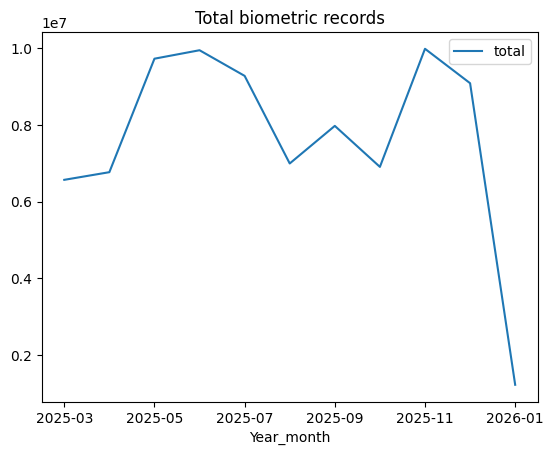

In [14]:
tot=biodf.groupby('Year_month')[bioage].sum().sum(axis=1).reset_index(name='total')

ax=tot.plot(x='Year_month',y='total',title='Total biometric records')
plt.show()


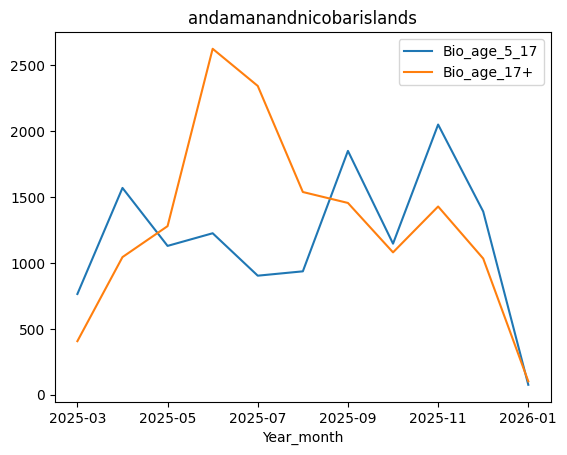

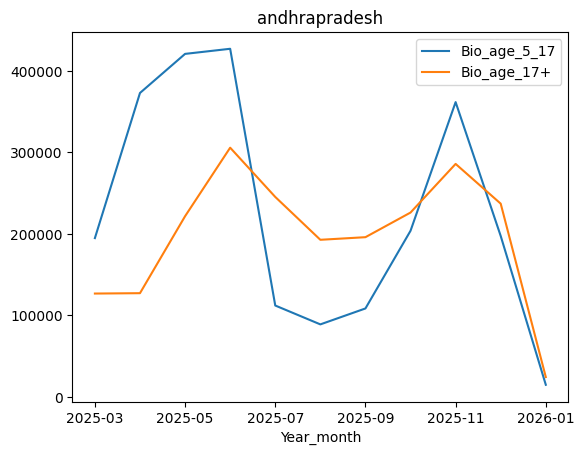

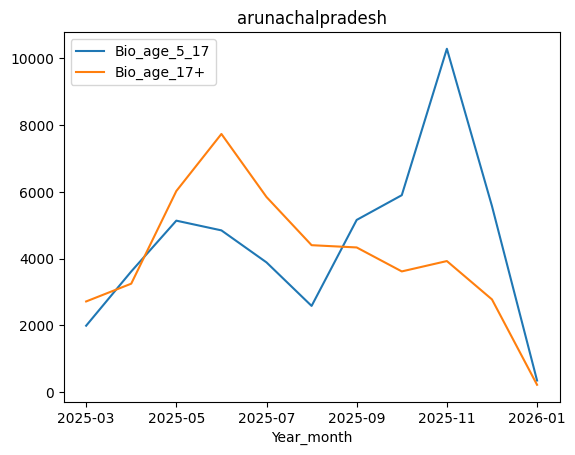

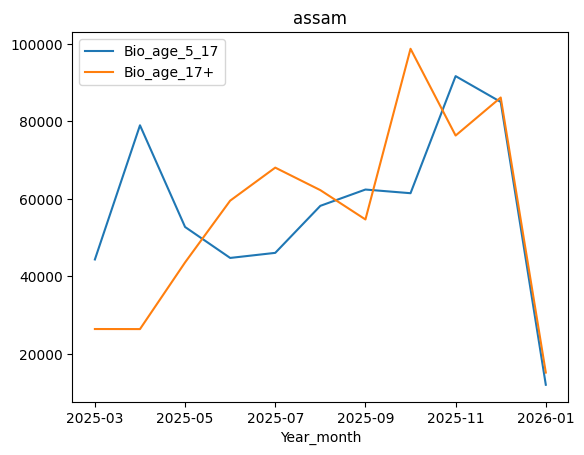

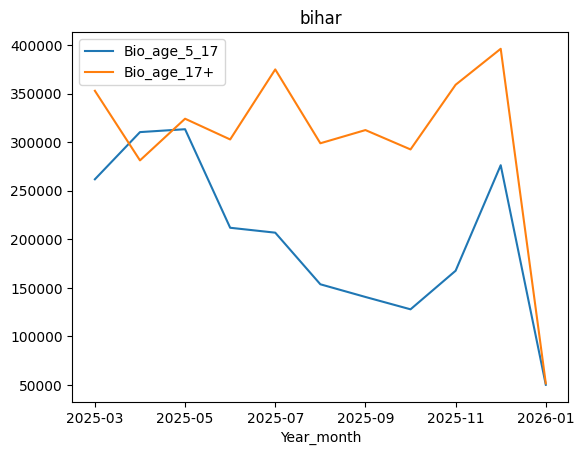

...

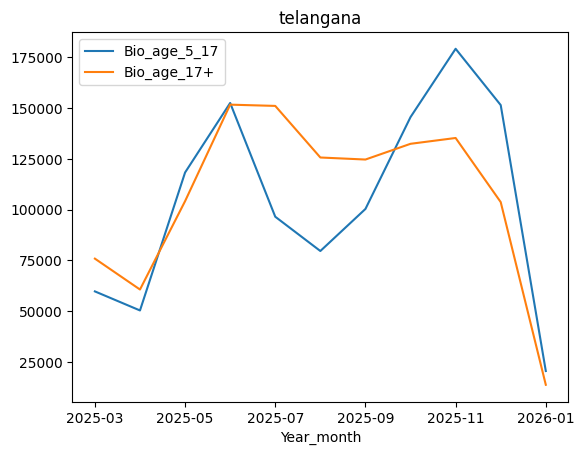

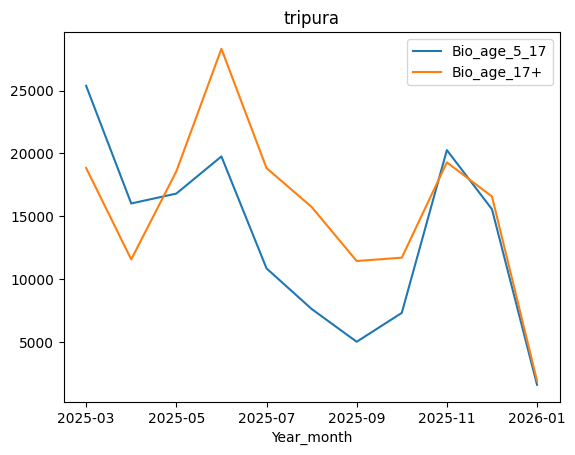

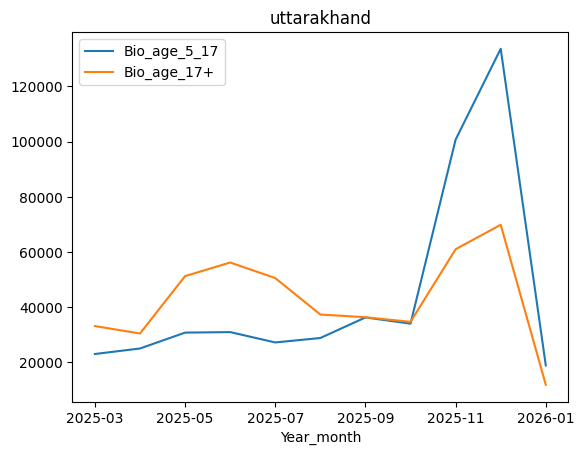

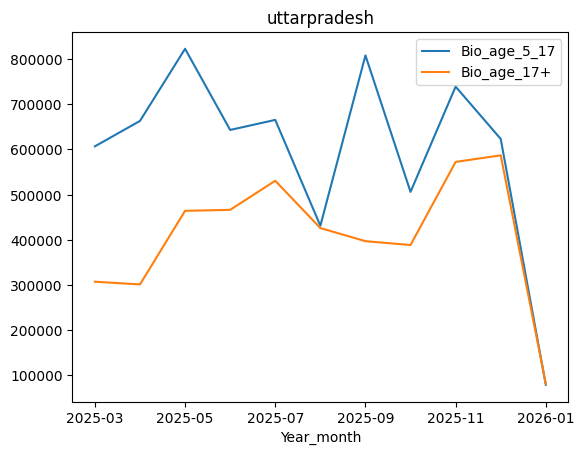

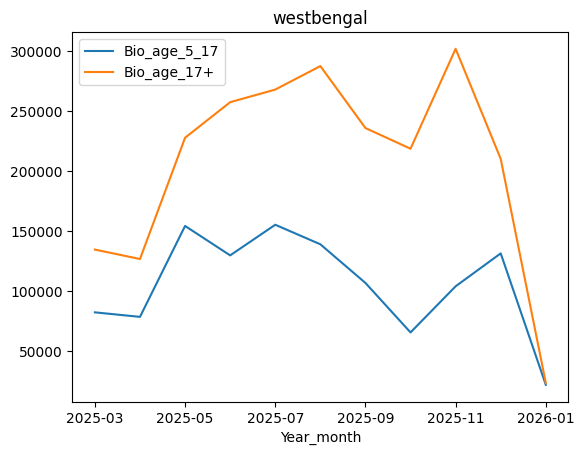

In [15]:
for state,d in biog.groupby('State'):
  d.plot(x='Year_month',y=bioage,title=state)
  plt.show()

In [22]:
# enrolfiles=glob.glob("api_data_aadhar_enrolment/enrol*.csv")
# enroldf=pd.concat(pd.read_csv(f) for f in enrolfiles)
ds = load_dataset("an42/uidai1", data_files="enrolapi1.csv")
enroldf = ds["train"].to_pandas()
enroldf['Date']=pd.to_datetime(enroldf['Date'],dayfirst=True)
enroldf['Year_month']=enroldf['Date'].dt.strftime('%Y-%m')
enroldf=state_proc(sp_low(enroldf,['State','District']))
enroldf=enroldf[enroldf['State']!='100000']
enrolage=[c for c in enroldf.columns if 'Age' in c]
enrolg=enroldf.groupby(['State','Year_month'])[enrolage].sum().reset_index()

In [18]:
enrolym=enroldf['Year_month'].unique()
enrolym

array(['2025-09', '2025-04', '2025-05', '2025-06', '2025-07', '2025-03',
       '2025-10', '2025-11', '2025-12', '2026-01'], dtype=object)

In [19]:
enroldf['State'].unique()

array(['andhrapradesh', 'arunachalpradesh', 'assam', 'bihar',
       'chandigarh', 'chhattisgarh', 'dadranagarhavelidamandiu', 'delhi',
       'goa', 'gujarat', 'haryana', 'himachalpradesh', 'jammuandkashmir',
       'jharkhand', 'karnataka', 'kerala', 'ladakh', 'madhyapradesh',
       'maharashtra', 'manipur', 'meghalaya', 'mizoram', 'nagaland',
       'odisha', 'punjab', 'uttarpradesh', 'westbengal', 'rajasthan',
       'tamilnadu', 'telangana', 'tripura', 'uttarakhand',
       'andamanandnicobarislands', 'sikkim', 'lakshadweep', 'puducherry'],
      dtype=object)

In [20]:
enroldf.count()

,0
Date,1208700
State,1208700
District,1208700
Pincode,1208700
Age_0_5,1208700
Age_5_17,1208700
Age_18_greater,1208700
Year_month,1208700


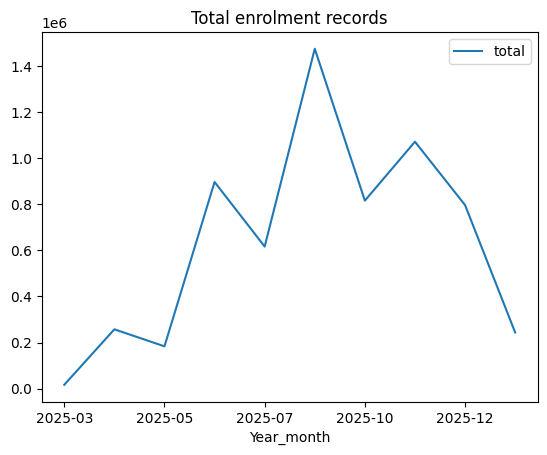

In [23]:
tot=enroldf.groupby('Year_month')[enrolage].sum().sum(axis=1).reset_index(name='total')

ax=tot.plot(x='Year_month',y='total',title='Total enrolment records')
plt.show()

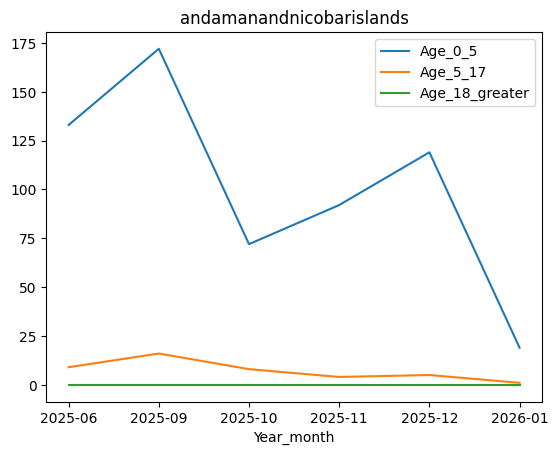

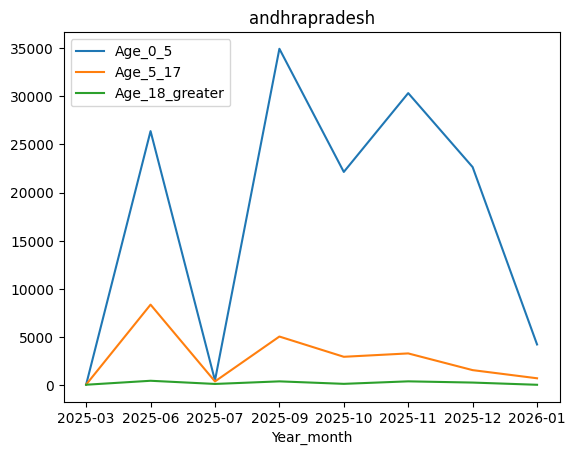

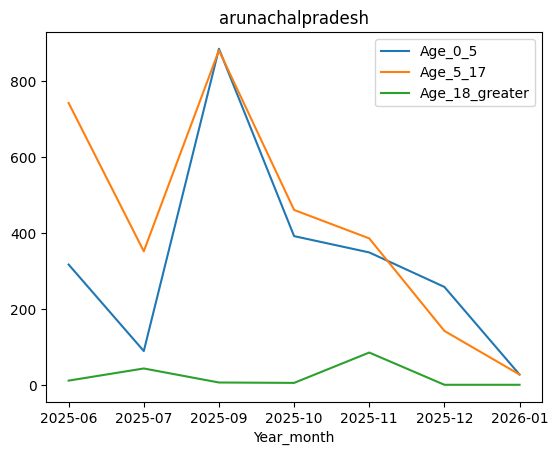

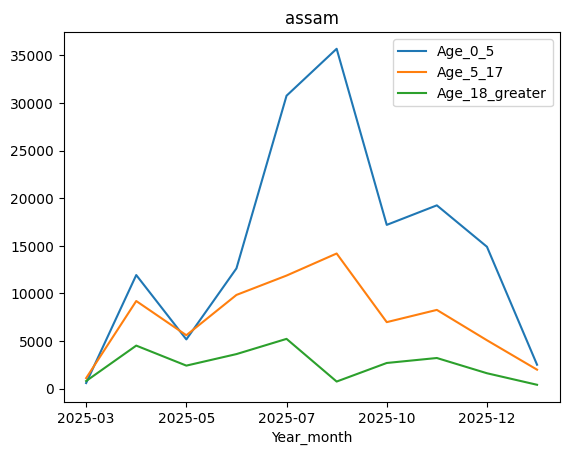

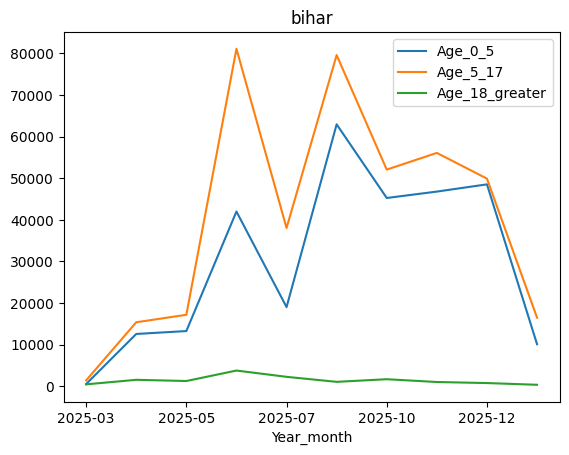

...

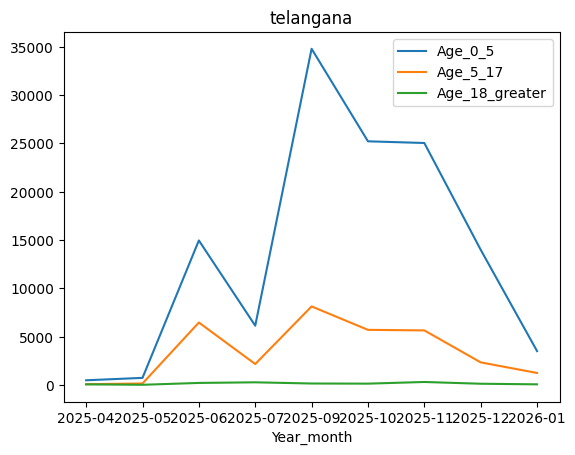

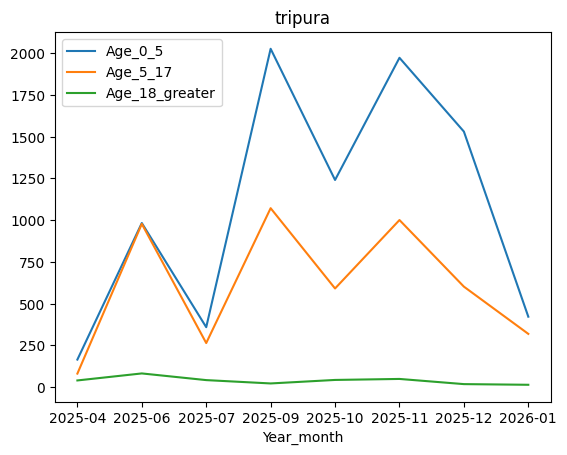

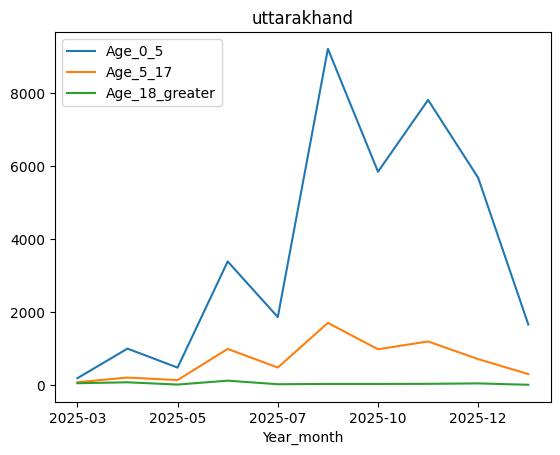

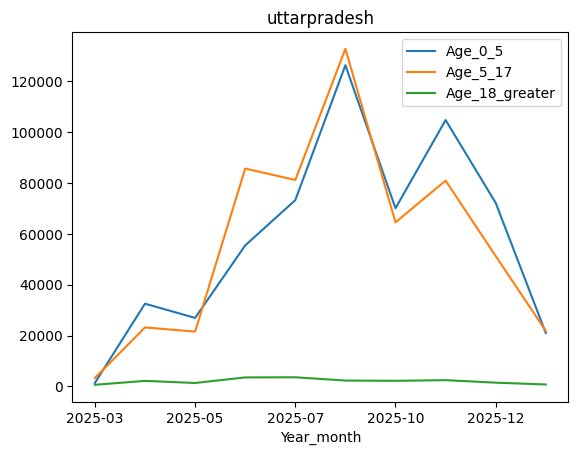

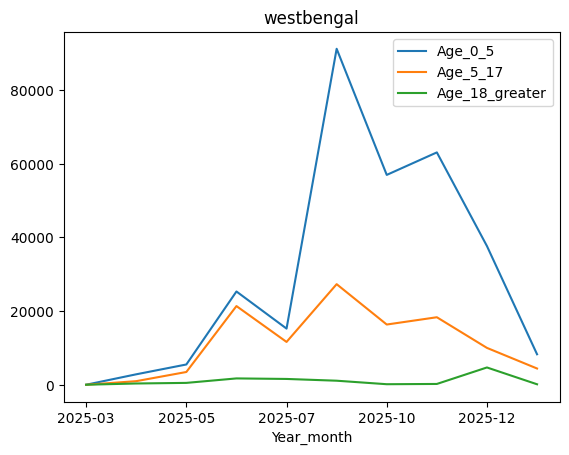

In [24]:
for state,d in enrolg.groupby('State'):
  d.plot(x='Year_month',y=enrolage,title=state)
  plt.show()

In [31]:
# demofiles=glob.glob("api_data_aadhar_demographic/demo*.csv")
# demodf=pd.concat(pd.read_csv(f) for f in demofiles)
ds = load_dataset("an42/uidai1", data_files="demoapi1.csv")
demodf = ds["train"].to_pandas()
demodf['Date']=pd.to_datetime(demodf['Date'],dayfirst=True)
demodf['Year_month']=demodf['Date'].dt.strftime('%Y-%m')
demodf=state_proc(sp_low(demodf,['State','District']))
demodf=demodf[demodf['State']!='100000']
demoage=[c for c in demodf.columns if 'age' in c]
demog=demodf.groupby(['State','Year_month'])[demoage].sum().reset_index()

In [26]:
demodf.count()

,0
Date,2375878
State,2375878
District,2375878
Pincode,2375878
Demo_age_5_17,2375878
Demo_age_17+,2375878
Year_month,2375878


In [27]:
demoym=demodf['Year_month'].unique()
demoym

array(['2025-03', '2025-04', '2025-05', '2025-06', '2025-07', '2025-09',
       '2025-10', '2025-11', '2025-12', '2026-01'], dtype=object)

In [28]:
demodf['State'].unique()

array(['westbengal', 'manipur', 'rajasthan', 'himachalpradesh',
       'telangana', 'kerala', 'uttarpradesh', 'madhyapradesh', 'bihar',
       'karnataka', 'maharashtra', 'punjab', 'gujarat', 'assam',
       'haryana', 'tamilnadu', 'odisha', 'arunachalpradesh',
       'andhrapradesh', 'uttarakhand', 'mizoram', 'chhattisgarh',
       'jharkhand', 'jammuandkashmir', 'delhi', 'goa', 'tripura',
       'chandigarh', 'sikkim', 'nagaland', 'meghalaya', 'puducherry',
       'ladakh', 'dadranagarhavelidamandiu', 'andamanandnicobarislands',
       'lakshadweep', 'greaterkailash2', '561203', 'punecity', 'gurgaon',
       'puthur'], dtype=object)

In [29]:
demodf['District'].unique()

array(['murshidabad', 'thoubal', 'sirohi', 'hooghly', 'una', 'sangareddy',
       'kannur', 'jaipur', 'varanasi', 'budaun', 'tikamgarh', 'fatehpur',
       'supaul', 'ramanagar', 'thiruvananthapuram', 'mandsaur',
       'pilibhit', 'buldhana', 'fatehgarhsahib', 'ratlam', 'gandhinagar',
       'samastipur', 'indore', 'gwalior', 'kollam', 'siwan', 'goalpara',
       'yamunanagar', 'tiruvannamalai', 'nirmal', 'rajkot', 'kachchh',
       'mayurbhanj', 'papumpare', 'jalandhar', 'n.t.r', 'nalbari',
       'nashik', 'palghar', 'vizianagaram', 'dharwad', 'almora',
       'jaisalmer', 'nagpur', 'kalaburagi', 'kolkata', 'nagaur', 'kolar',
       'tiruvallur', 'puri', 'deoria', 'agarmalwa', 'belgaum', 'navsari',
       'mamit', 'hanumakonda', 'jodhpur', 'balaghat', 'sikar',
       'udhamsinghnagar', 'barabanki', 'nadia', 'nalanda', 'perambalur',
       'harda', 'panchmahals', 'thanjavur', 'tumkur', 'rajannasircilla',
       'ganjam', 'anantapur', 'rangareddi', 'y.s.r', 'chengalpattu',
       'ahm

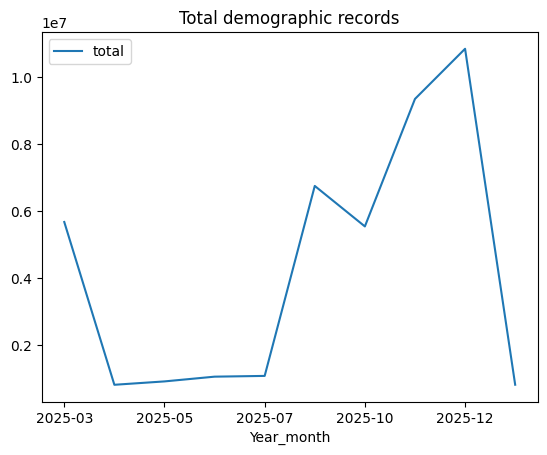

In [32]:
tot=demodf.groupby('Year_month')[demoage].sum().sum(axis=1).reset_index(name='total')

ax=tot.plot(x='Year_month',y='total',title='Total demographic records')
plt.show()

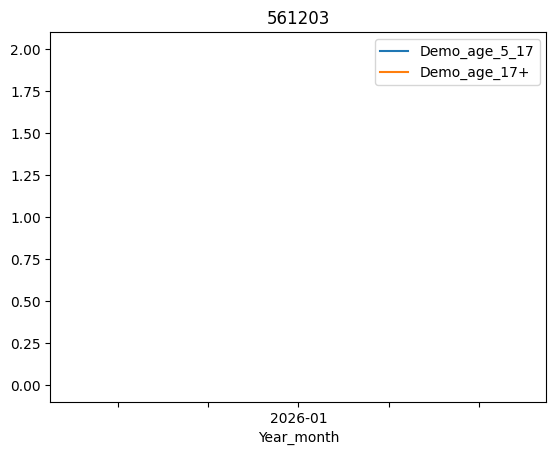

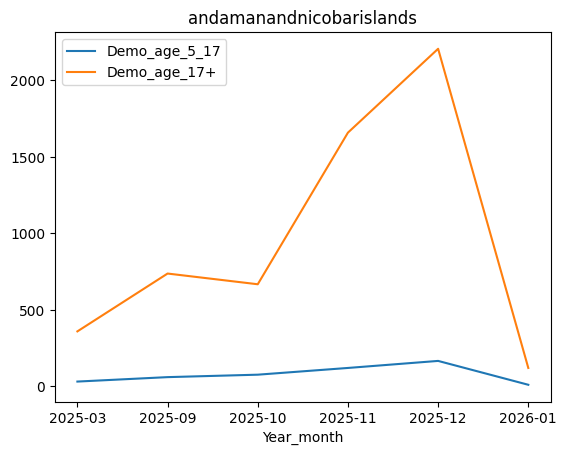

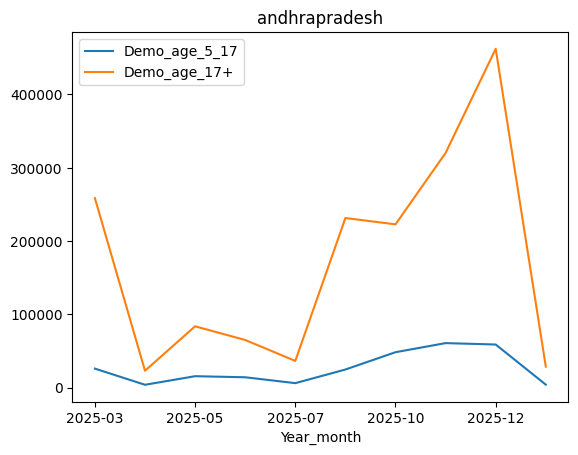

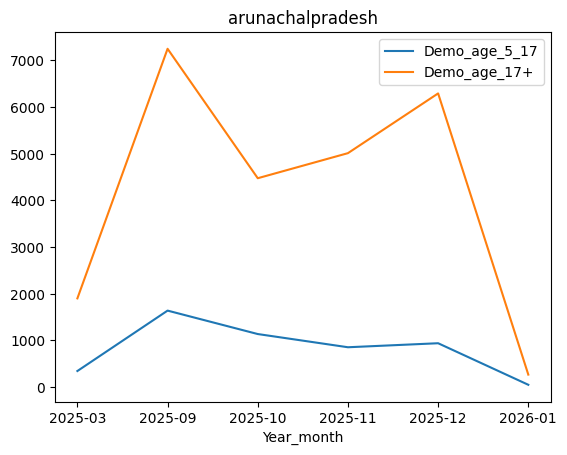

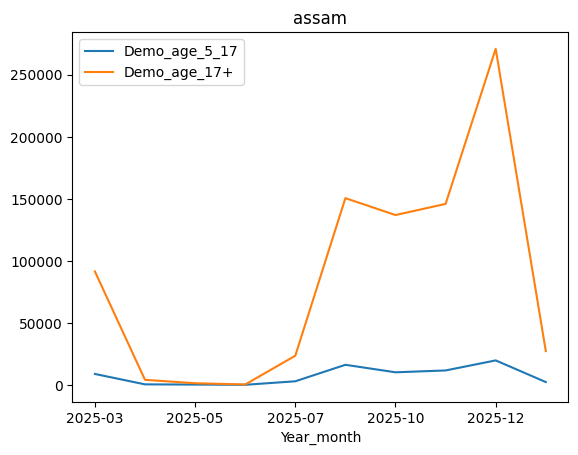

...

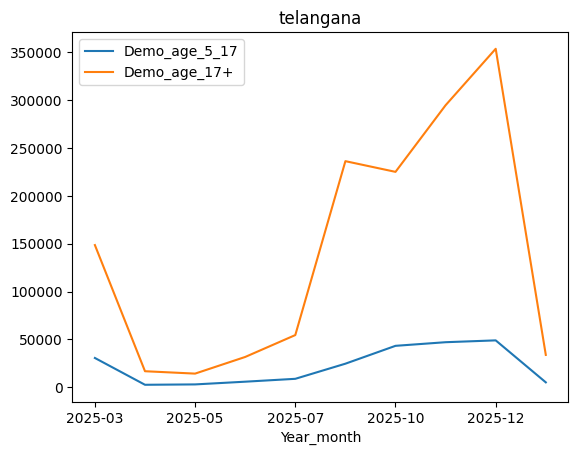

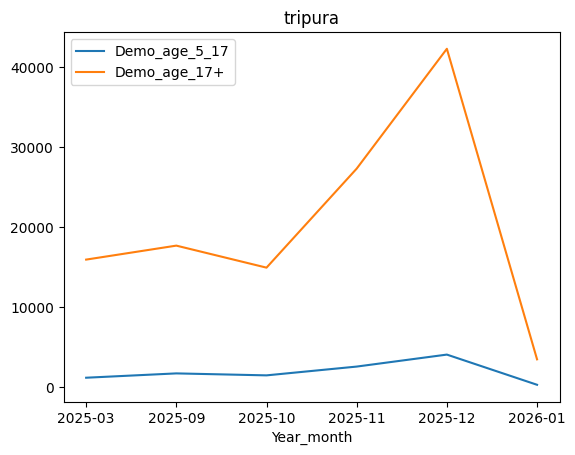

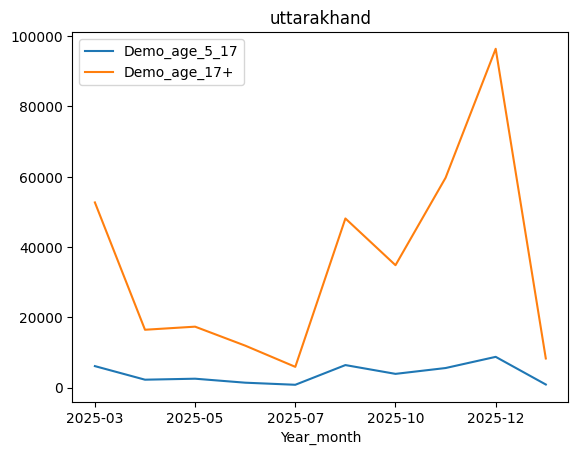

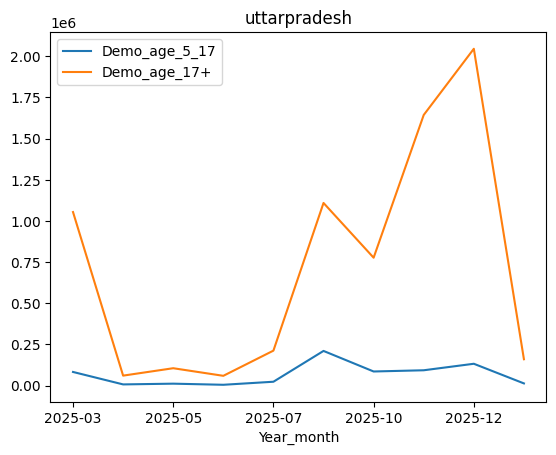

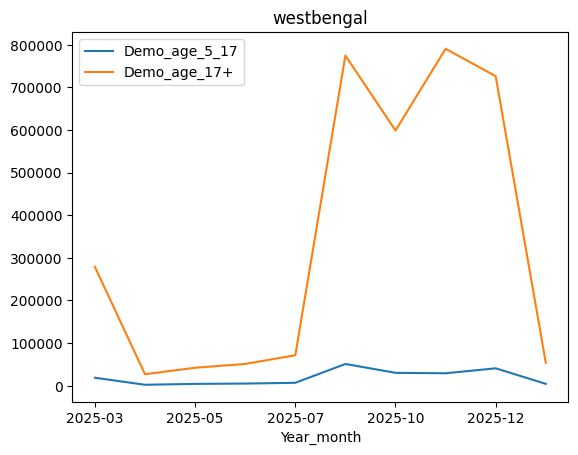

In [33]:
for state,d in demog.groupby('State'):
  d.plot(x='Year_month',y=demoage,title=state)
  plt.show()

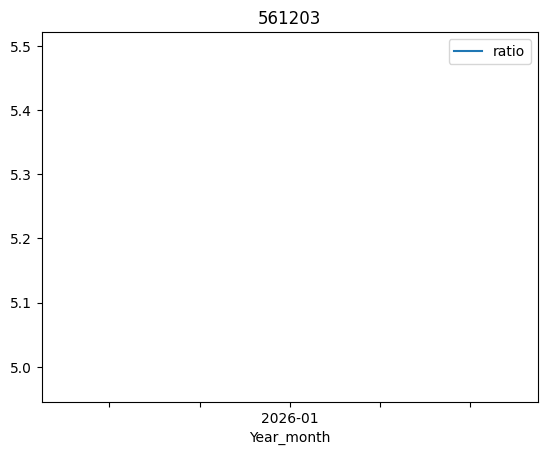

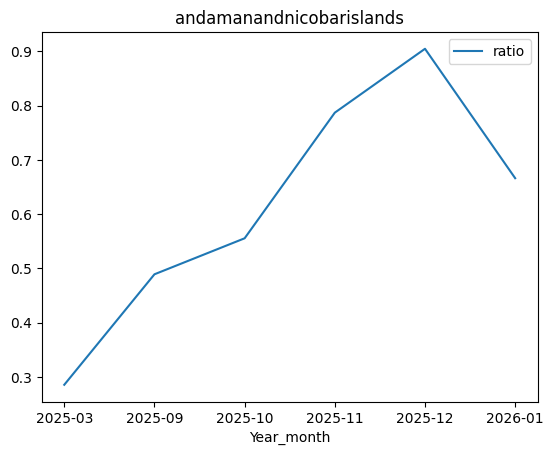

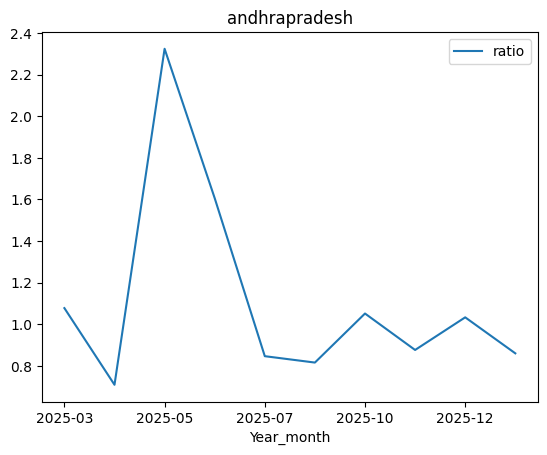

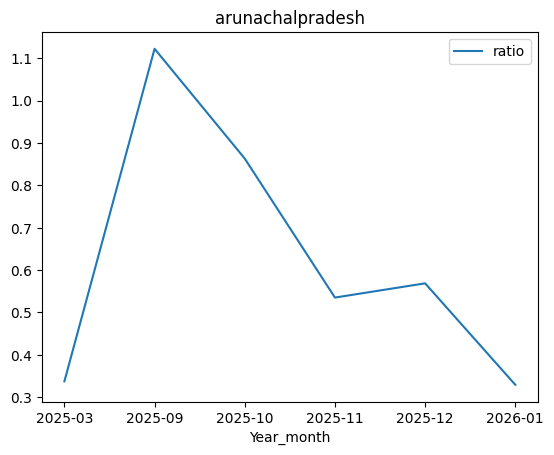

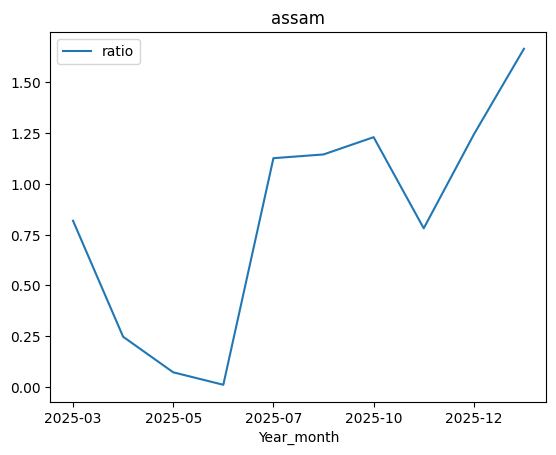

...

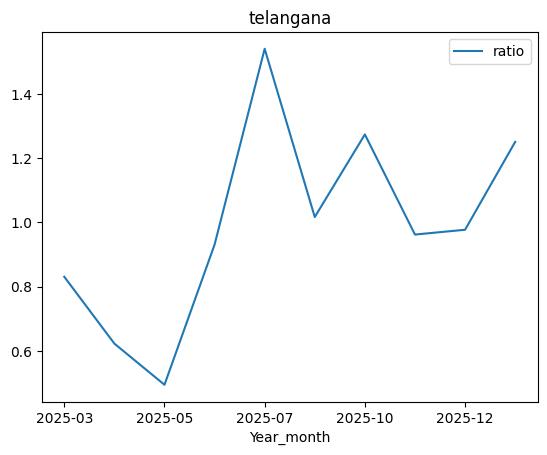

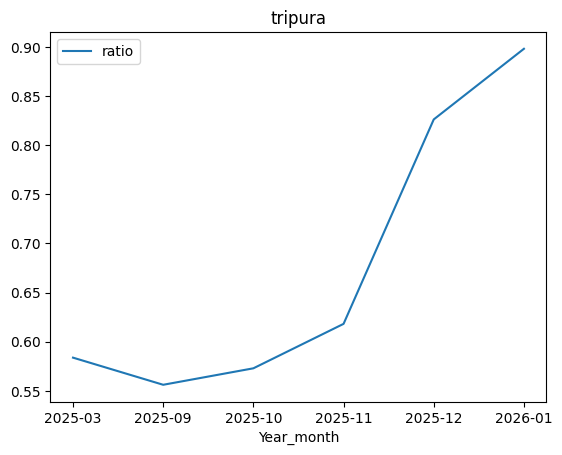

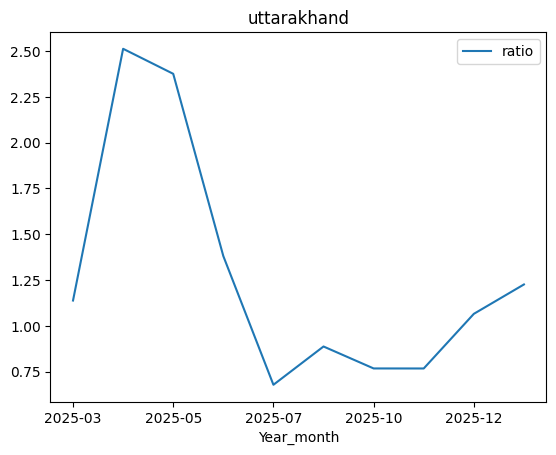

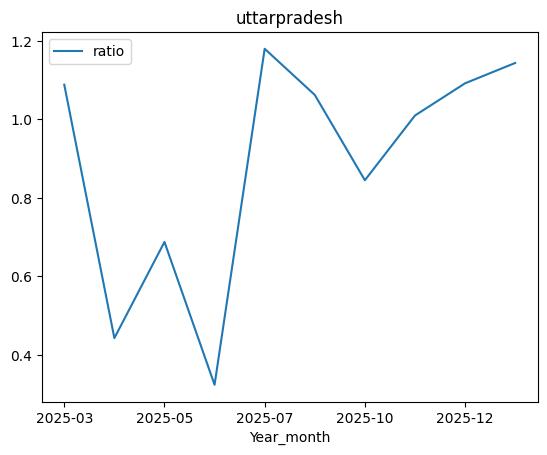

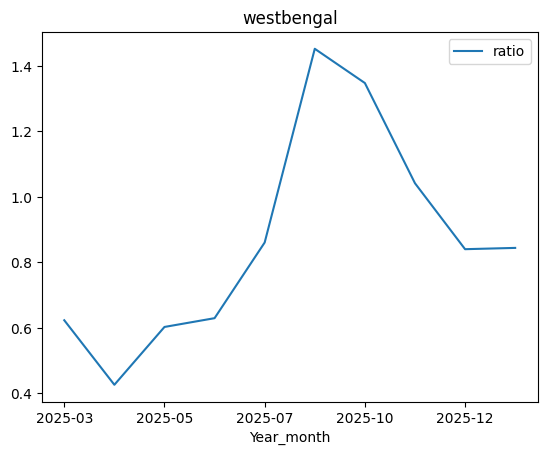

In [35]:
# state-month totals
s = demodf.groupby(['State','Year_month'])[demoage].sum().sum(axis=1).reset_index(name='val')

# total-month totals
t = demodf.groupby('Year_month')[demoage].sum().sum(axis=1).reset_index(name='total')

# normalize by mean
s['norm'] = s['val'] / s.groupby('State')['val'].transform('mean')
t['norm_total'] = t['total'] / t['total'].mean()

# merge + ratio
m = s.merge(t[['Year_month','norm_total']], on='Year_month')
m['ratio'] = m['norm'] / m['norm_total']

# plot
for state, d in m.groupby('State'):
    d.plot(x='Year_month', y='ratio', title=state)
    plt.show()


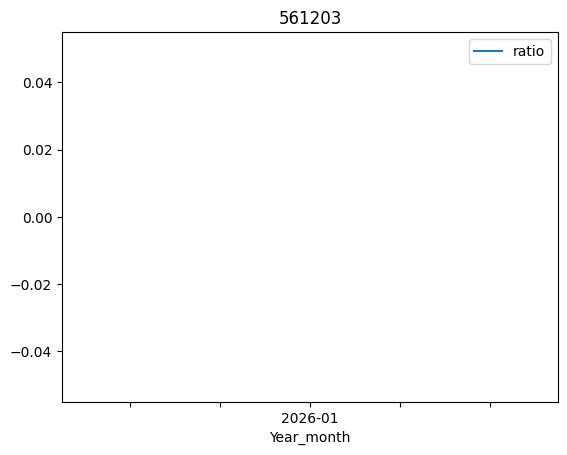

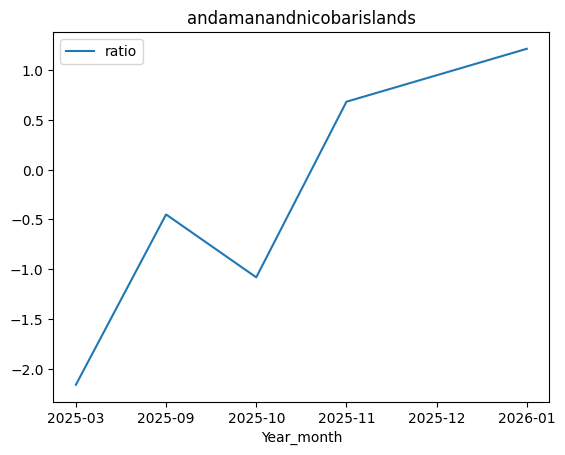

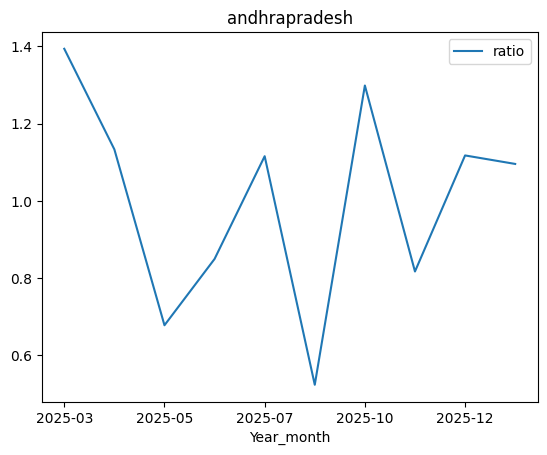

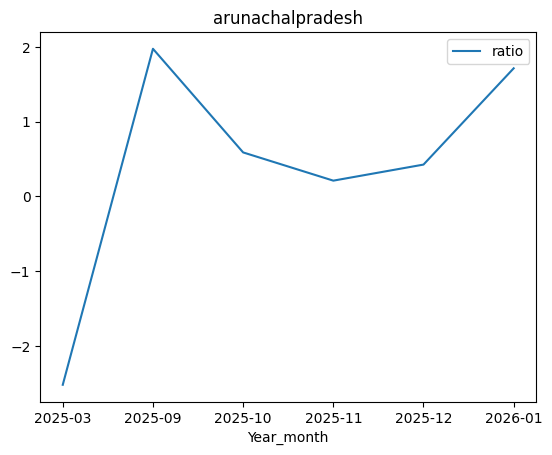

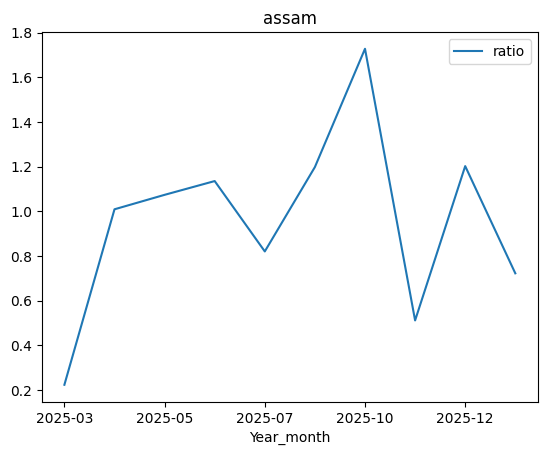

...

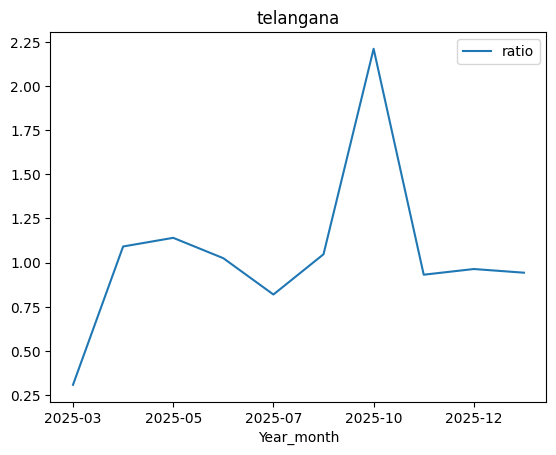

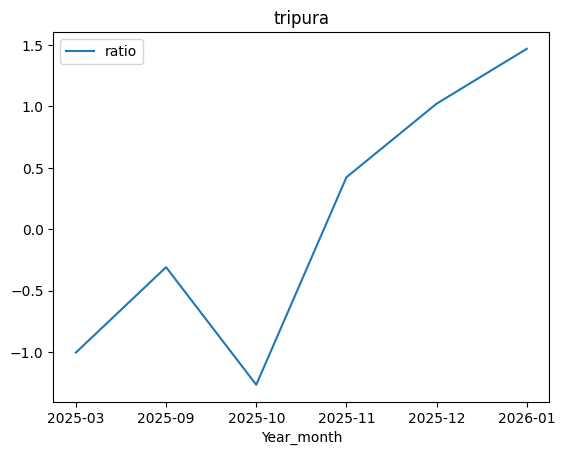

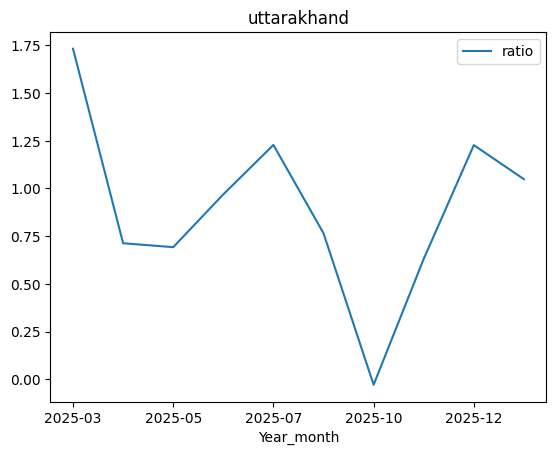

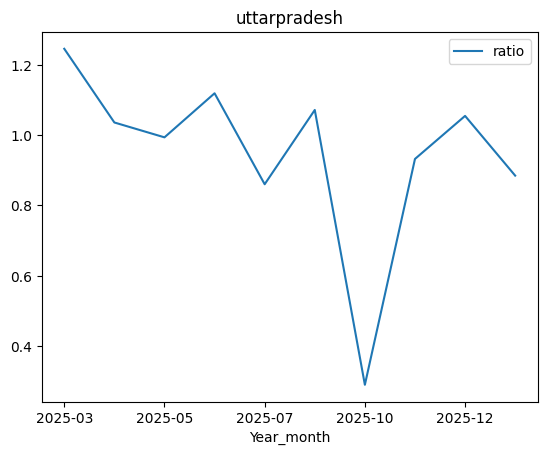

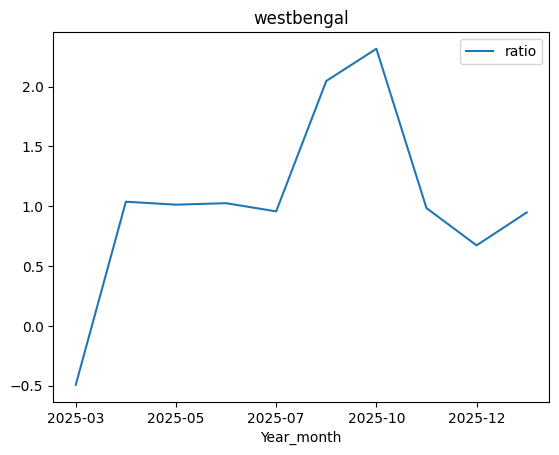

In [36]:
from sklearn.preprocessing import StandardScaler

# state-month totals
s = demodf.groupby(['State','Year_month'])[demoage].sum().sum(axis=1).reset_index(name='val')

# total-month totals
t = demodf.groupby('Year_month')[demoage].sum().sum(axis=1).reset_index(name='total')

sc = StandardScaler()

# scale per state
s['z_state'] = s.groupby('State')['val'].transform(lambda x: sc.fit_transform(x.values.reshape(-1,1)).ravel())

# scale total
t['z_total'] = sc.fit_transform(t[['total']]).ravel()

# merge + ratio
m = s.merge(t[['Year_month','z_total']], on='Year_month')
m['ratio'] = m['z_state'] / m['z_total']

# plot
for state, d in m.groupby('State'):
    d.plot(x='Year_month', y='ratio', title=state)
    plt.show()


In [37]:
demodf[demodf['Year_month']=='2025-10'][demoage].sum().sum()

np.int64(5549562)

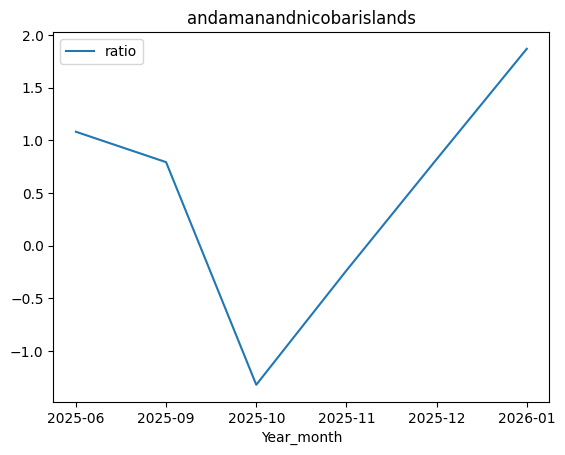

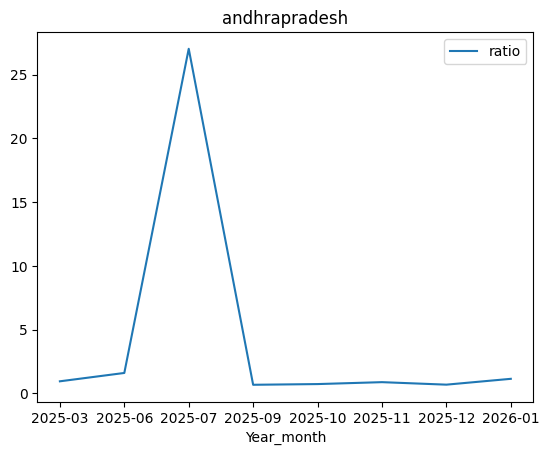

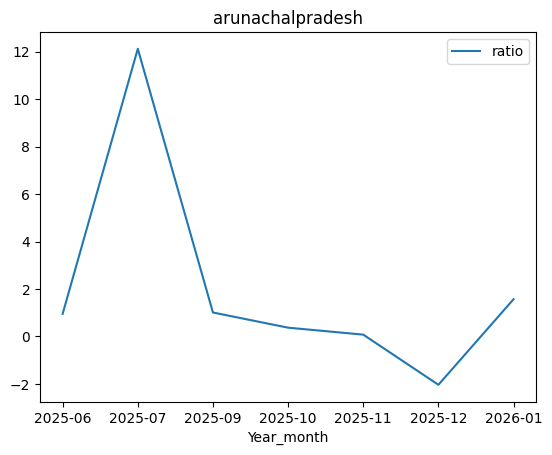

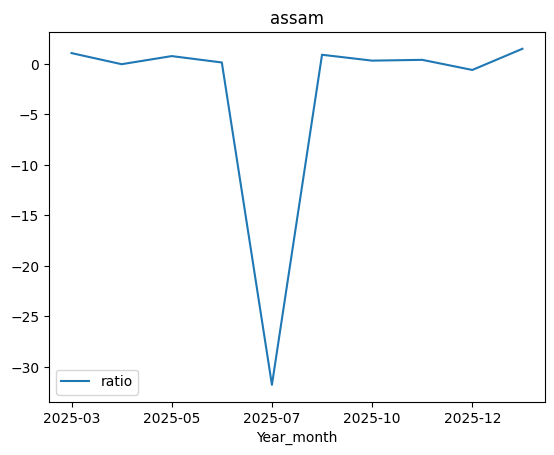

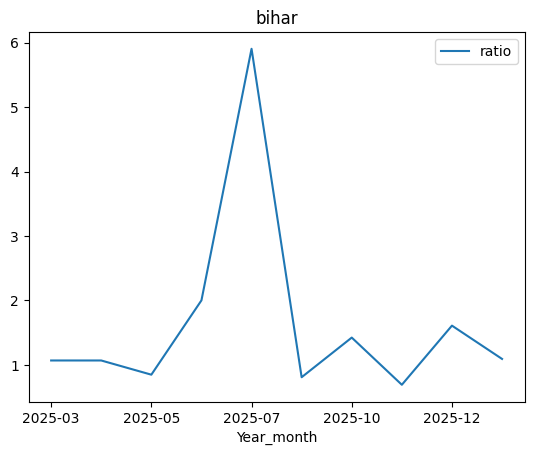

...

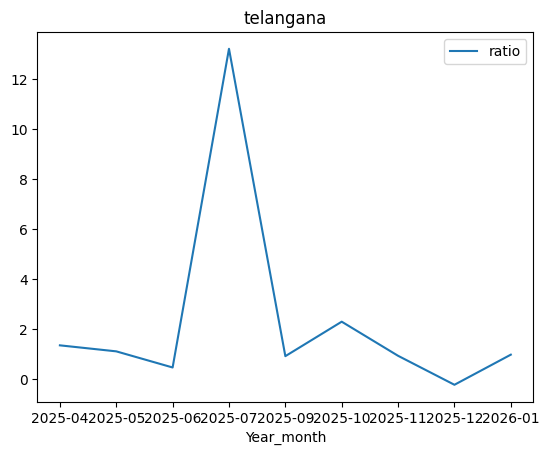

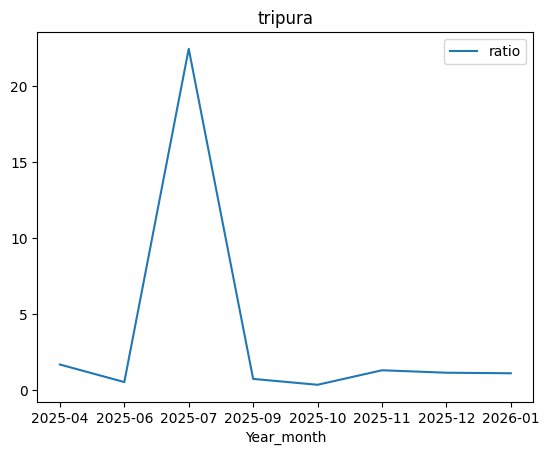

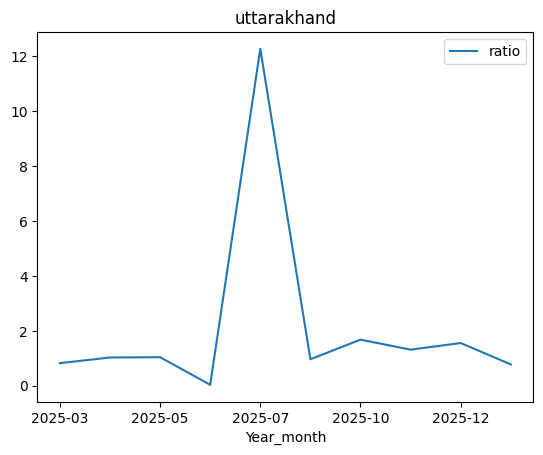

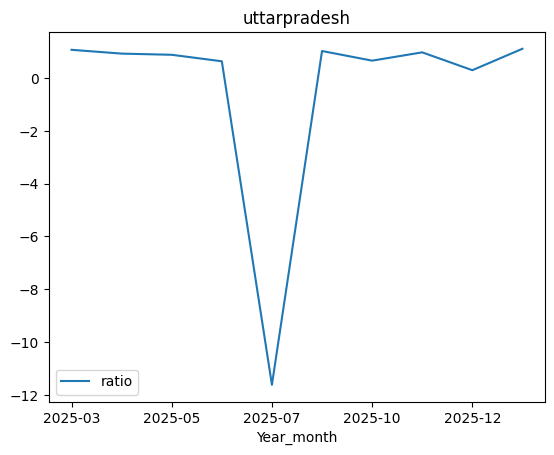

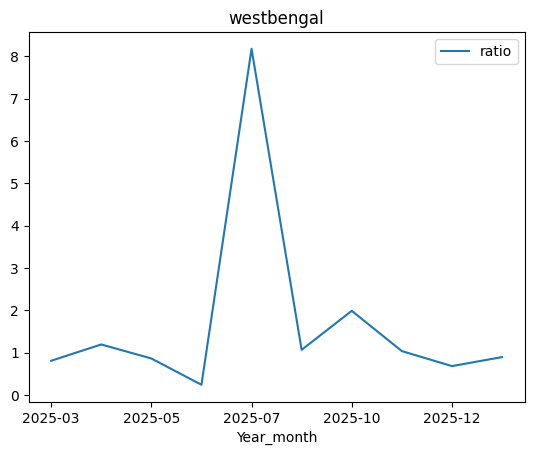

In [39]:
s = enroldf.groupby(['State','Year_month'])[enrolage].sum().sum(axis=1).reset_index(name='val')
t = enroldf.groupby('Year_month')[enrolage].sum().sum(axis=1).reset_index(name='total')

sc = StandardScaler()
s['z_state'] = s.groupby('State')['val'].transform(lambda x: sc.fit_transform(x.values.reshape(-1,1)).ravel())
t['z_total'] = sc.fit_transform(t[['total']]).ravel()
m = s.merge(t[['Year_month','z_total']], on='Year_month')
m['ratio'] = m['z_state'] / m['z_total']

for state, d in m.groupby('State'):
    d.plot(x='Year_month', y='ratio', title=state)
    plt.show()


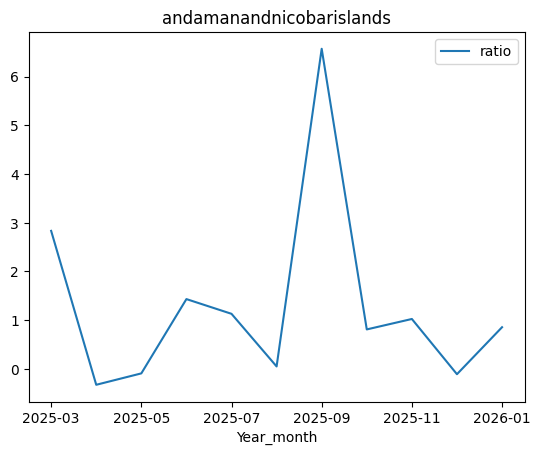

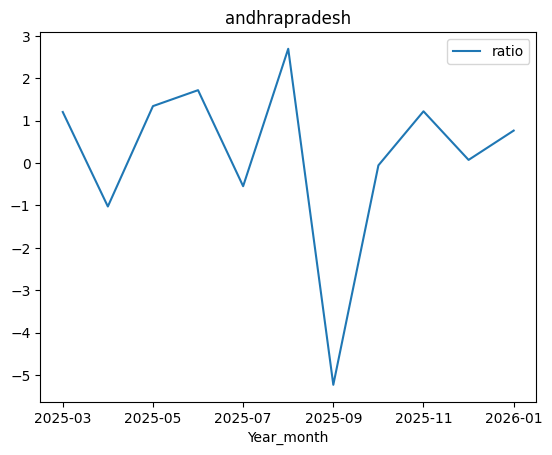

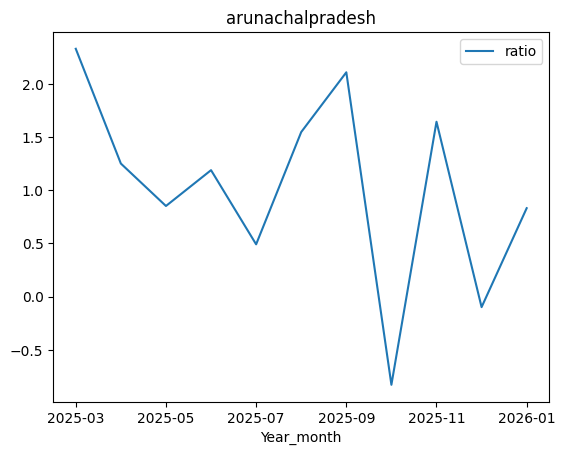

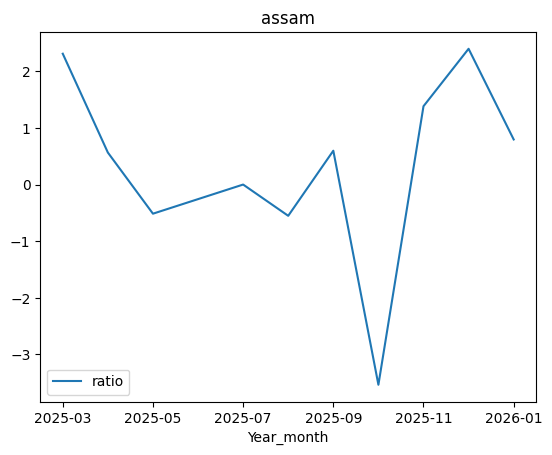

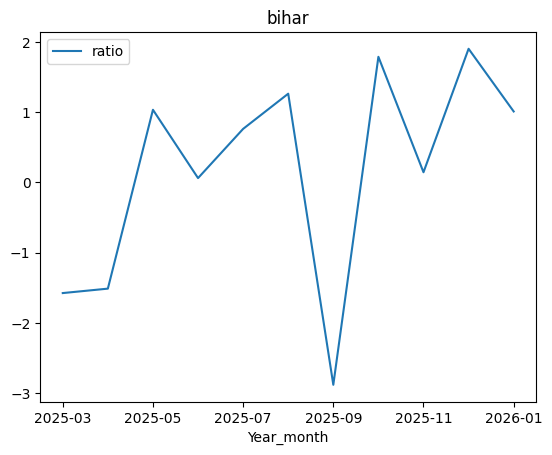

...

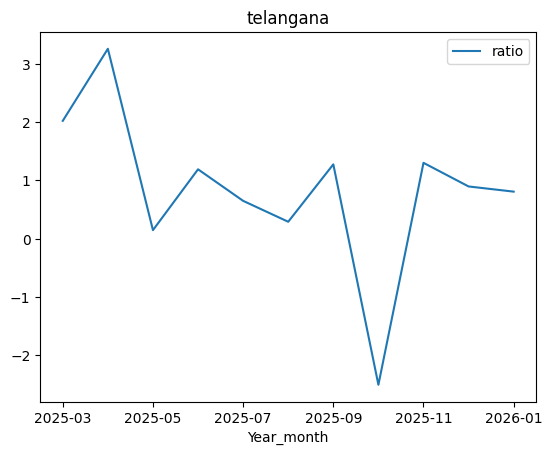

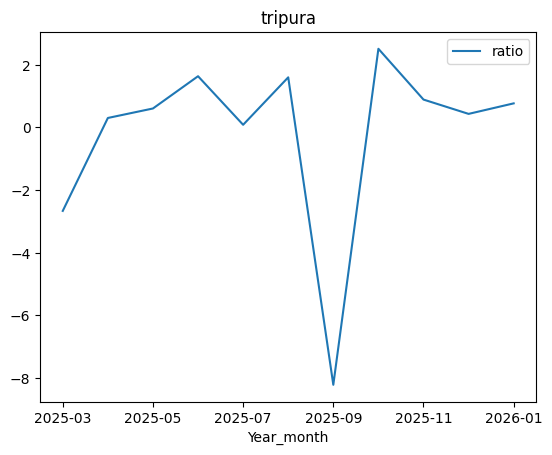

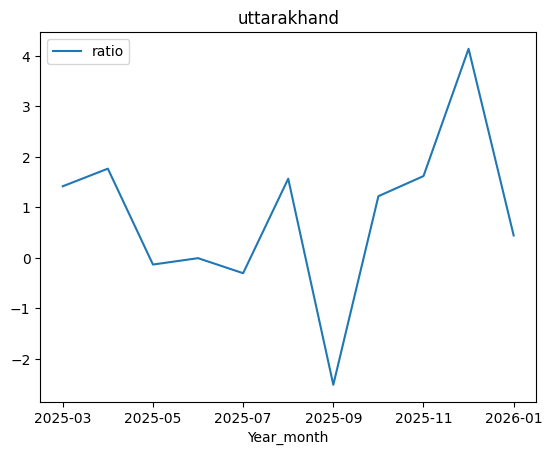

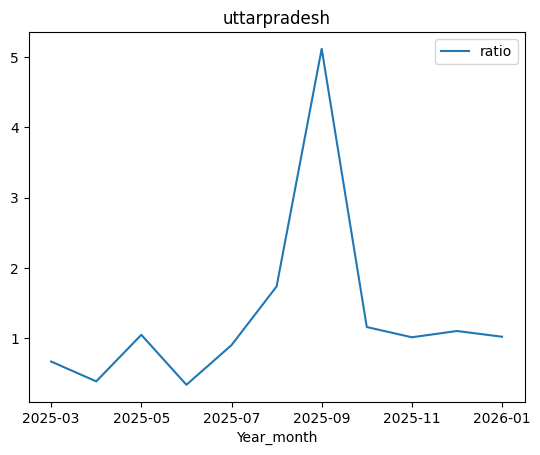

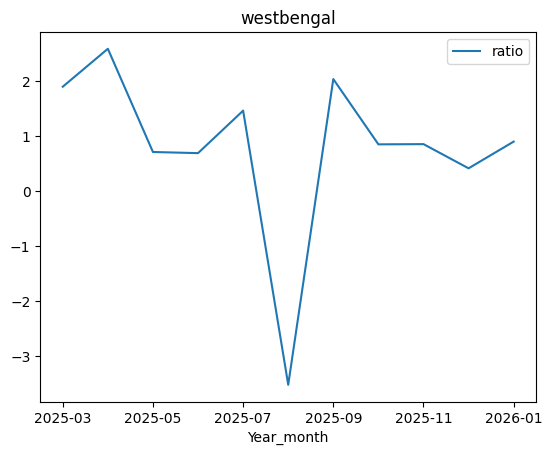

In [40]:
s = biodf.groupby(['State','Year_month'])[bioage].sum().sum(axis=1).reset_index(name='val')
t = biodf.groupby('Year_month')[bioage].sum().sum(axis=1).reset_index(name='total')

sc = StandardScaler()
s['z_state'] = s.groupby('State')['val'].transform(lambda x: sc.fit_transform(x.values.reshape(-1,1)).ravel())
t['z_total'] = sc.fit_transform(t[['total']]).ravel()
m = s.merge(t[['Year_month','z_total']], on='Year_month')
m['ratio'] = m['z_state'] / m['z_total']

for state, d in m.groupby('State'):
    d.plot(x='Year_month', y='ratio', title=state)
    plt.show()